In [6]:
import os
import sys

import matplotlib.pyplot as plt
import numpy as np

In [7]:
nb_dir = os.path.split(os.getcwd())[0]
if nb_dir not in sys.path:
    sys.path.append(nb_dir)

In [8]:
import taylor_vae as tvae

In [9]:
# generate random data
seed = 37
coeffs_matrix = tvae.gen_random_coeffs_matrix(seed)

bounding_region, F = tvae.make_poly_curves_from_coefficients(
    coeffs_matrix, 
    num_points=1000
)

C:\Users\the_s\Documents\python_projects\github\taylor_vae\vae\taylor_vae.py:451: RuntimeWarning: invalid value encountered in true_divide
  (F[:, :, i] - a) / (b - a)


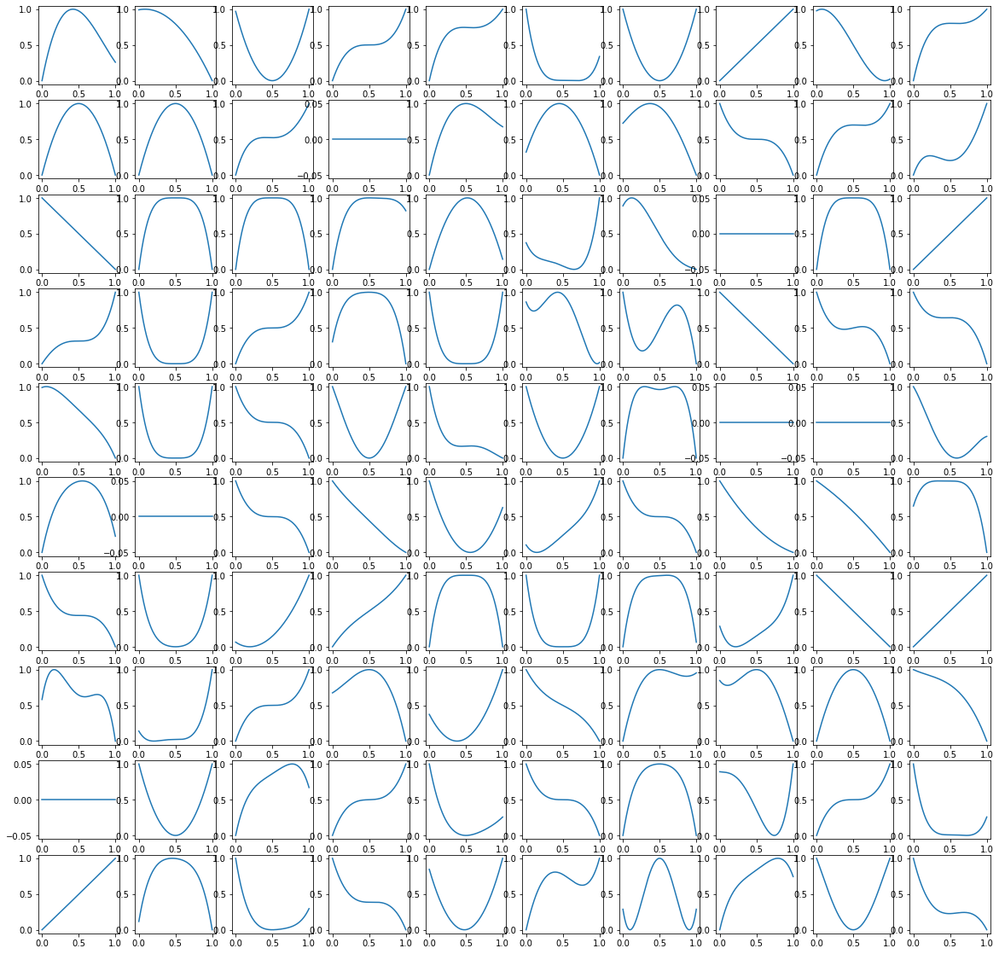

In [10]:
# plot the train polynomials
plt.figure(figsize=(20, 20))
for i, f in enumerate(F[: 100, :, :]):
    plt.subplot(10, 10, i + 1)
    plt.plot(
        f[:, 1],
        f[:, 0]
    )
    # plt.axis('off')
    del i, f
plt.show()

In [11]:
train_idx = np.random.default_rng(
    seed
).choice(
    F.shape[0],
    size=int(0.8 * F.shape[0]),
    replace=False
)
test_idx = list(set(range(F.shape[0])) - set(train_idx))

x_train = F[train_idx].astype('float32')
x_test = F[test_idx].astype('float32')

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d (Conv1D)              (None, 499, 32)           224       
_________________________________________________________________
batch_normalization (BatchNo (None, 499, 32)           128       
_________________________________________________________________
activation (Activation)      (None, 499, 32)           0         
_________________________________________________________________
conv1d_1 (Conv1D)            (None, 249, 64)           6208      
_________________________________________________________________
batch_normalization_1 (Batch (None, 249, 64)           256       
_________________________________________________________________
activation_1 (Activation)    (None, 249, 64)           0         
_________________________________________________________________
flatten (Flatten)            (None, 15936)             0

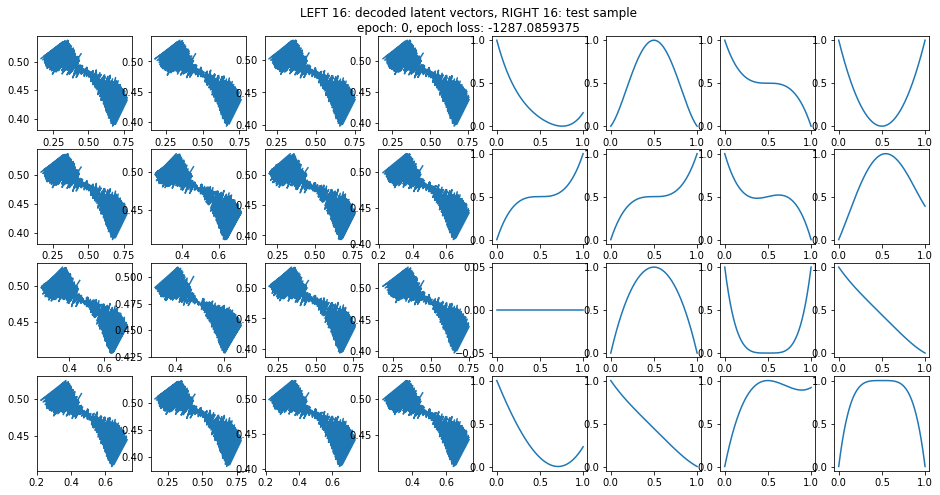

3.909916877746582 -- time elapse for 0 epoch.
Mean loss over test batches: -1198.90478515625, epoch: 1


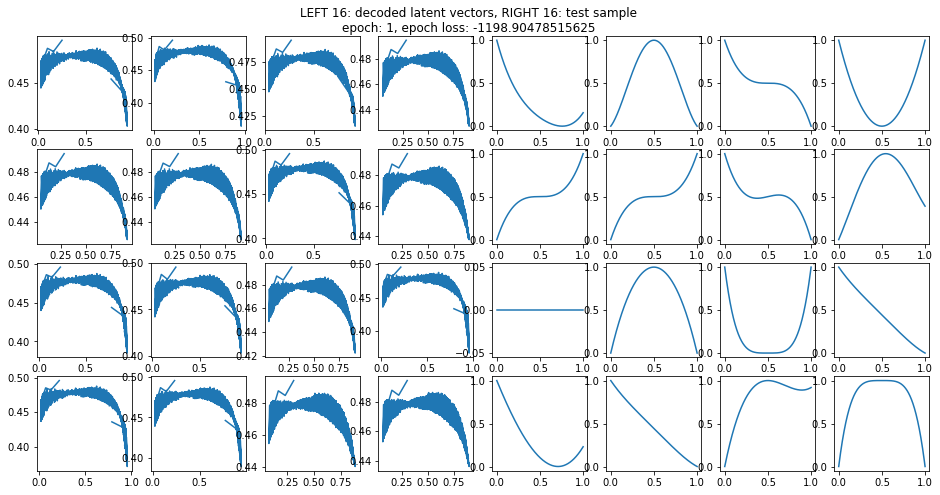

1.8398683071136475 -- time elapse for 1 epoch.
Mean loss over test batches: -1193.9599609375, epoch: 2


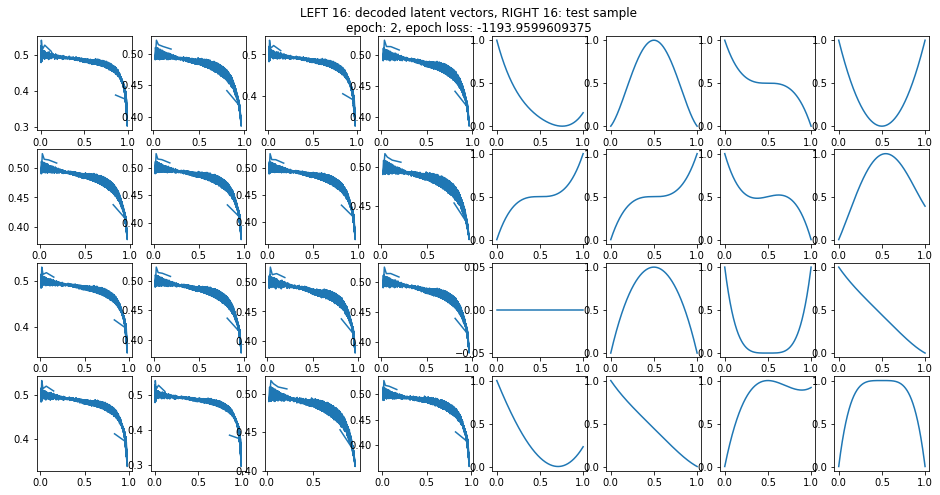

1.8901140689849854 -- time elapse for 2 epoch.
Mean loss over test batches: -1188.9697265625, epoch: 3


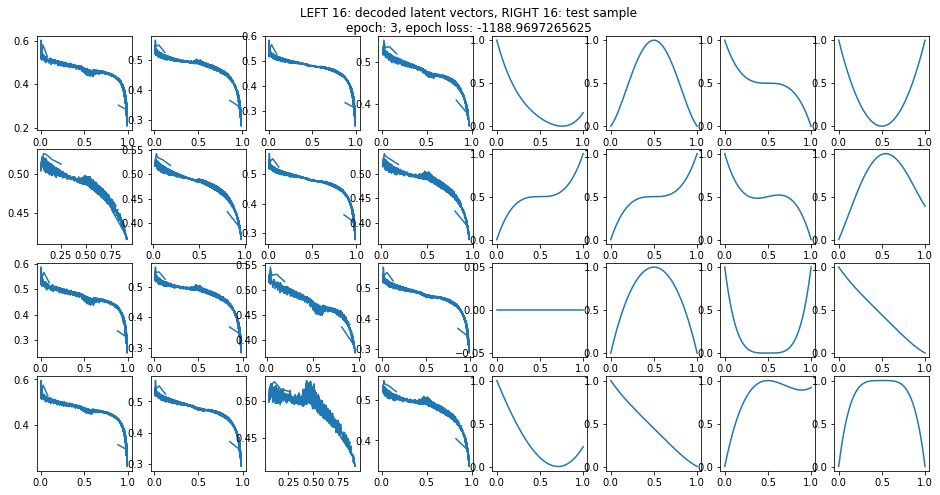

1.828420639038086 -- time elapse for 3 epoch.
Mean loss over test batches: -1030.362060546875, epoch: 4


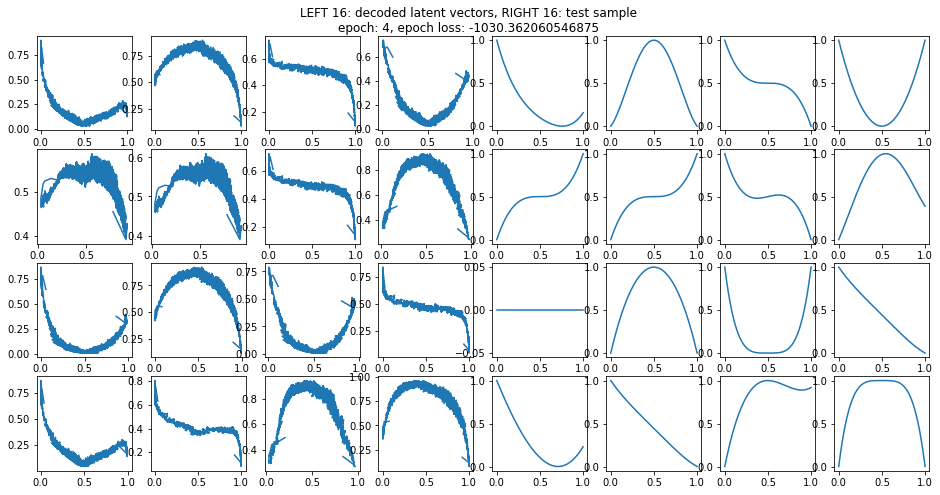

1.8408217430114746 -- time elapse for 4 epoch.
Mean loss over test batches: -973.9431762695312, epoch: 5


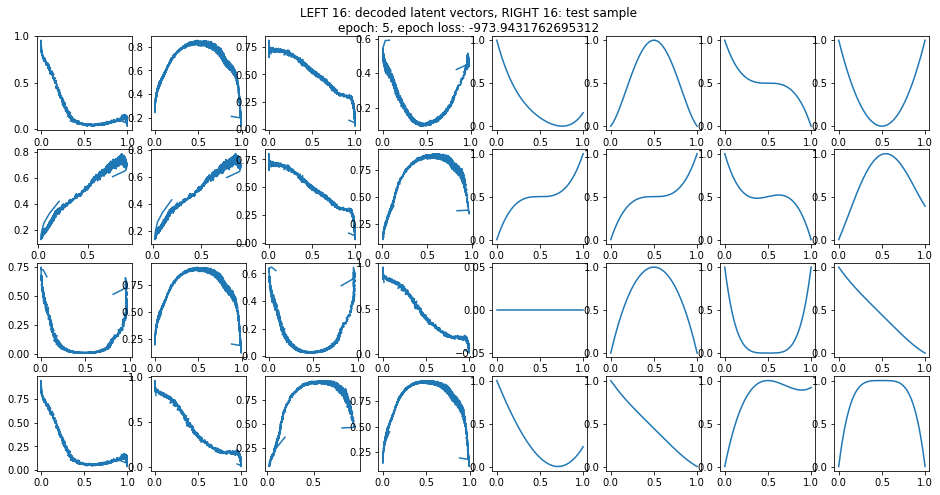

1.89695143699646 -- time elapse for 5 epoch.
Mean loss over test batches: -959.6043090820312, epoch: 6


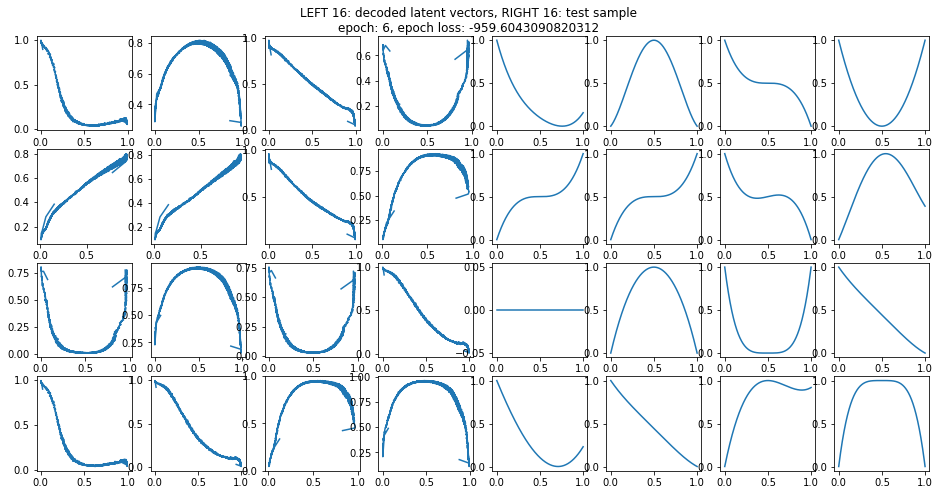

1.931983470916748 -- time elapse for 6 epoch.
Mean loss over test batches: -956.3905029296875, epoch: 7


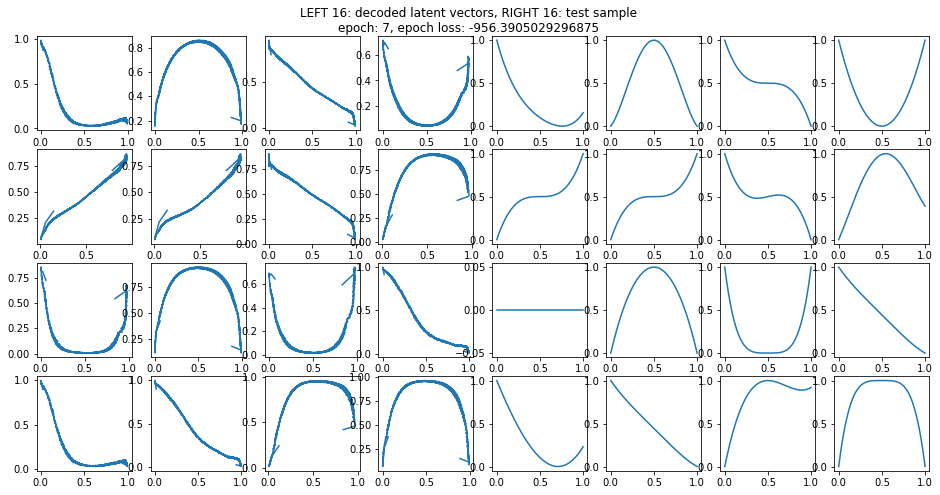

1.8103196620941162 -- time elapse for 7 epoch.
Mean loss over test batches: -956.705078125, epoch: 8


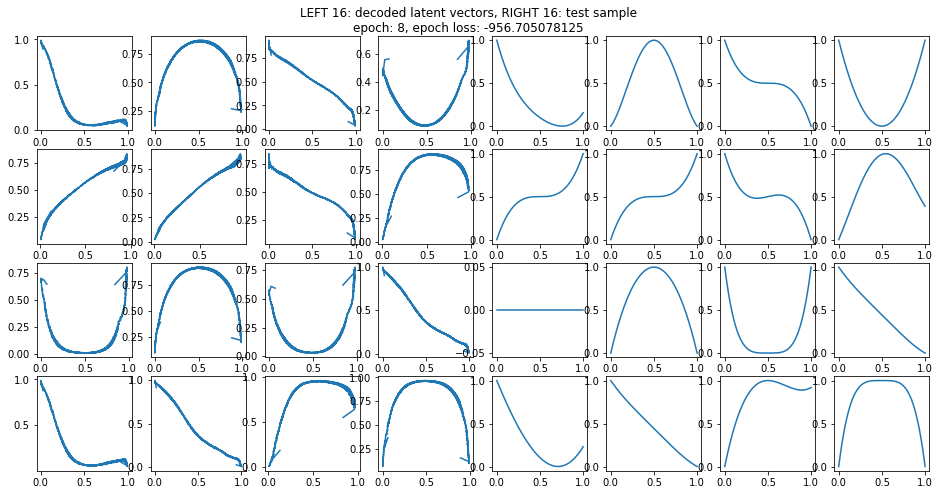

1.7778887748718262 -- time elapse for 8 epoch.
Mean loss over test batches: -952.6472778320312, epoch: 9


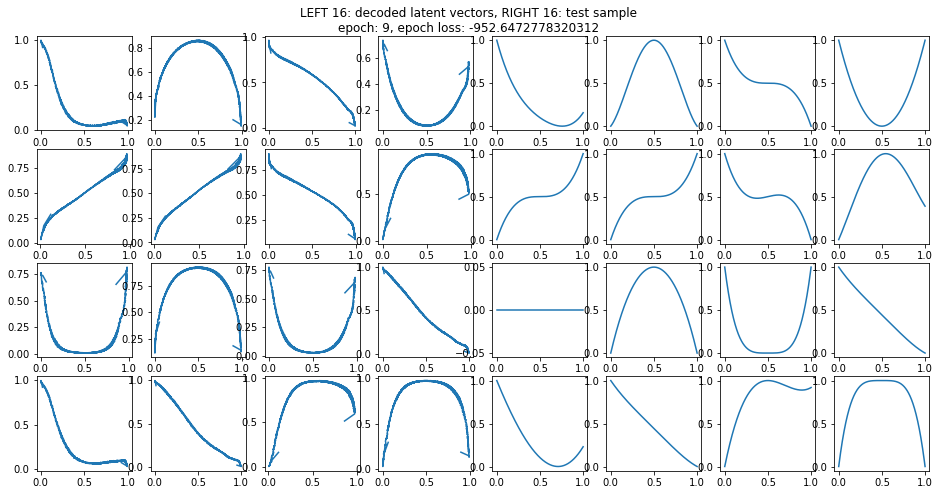

1.827437162399292 -- time elapse for 9 epoch.


In [13]:
# train VAE
vae_obj = tvae.VAE(x_train[0, :, :].shape, latent_dim=2, save_dir=None)

vae_obj.train(
      x_train,
      x_test=x_test,
      epochs=10
)

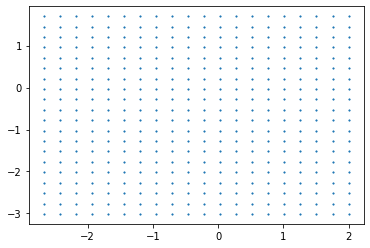

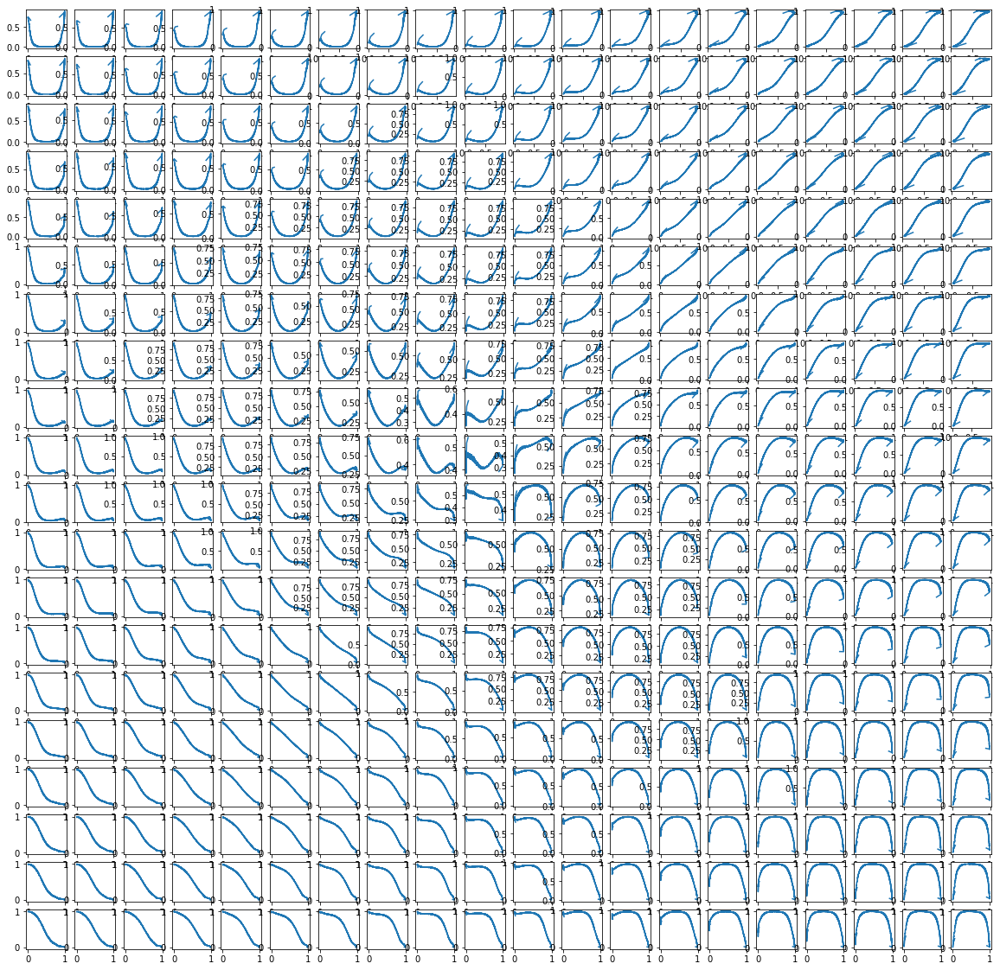

In [14]:
latent_vectors = vae_obj.generate_latent_vectors(x_test)
lattice = vae_obj.gen_lattice_from_latent_space(latent_vectors, 20)
decoded_latice = vae_obj.decode_latent_vectors(lattice)

plt.scatter(
    lattice[:, 0],
    lattice[:, 1],
    marker='X',
    s=1,
)
plt.show()

plt.figure(figsize=(20, 20))
for i in range(lattice.shape[0]):
    plt.subplot(20, 20, i+1)
    plt.plot(
        decoded_latice[i, :, 1],
        decoded_latice[i, :, 0]
    )
    # plt.axis('off')
del i
plt.show()

In [25]:
# generate taylor series
coeffs_matrix = np.diag(np.ones(100))

bounding_region, F = tvae.make_poly_curves_from_coefficients(
    coeffs_matrix, 
    num_points=100
)

C:\Users\the_s\Documents\python_projects\github\taylor_vae\vae\taylor_vae.py:451: RuntimeWarning: invalid value encountered in true_divide
  (F[:, :, i] - a) / (b - a)


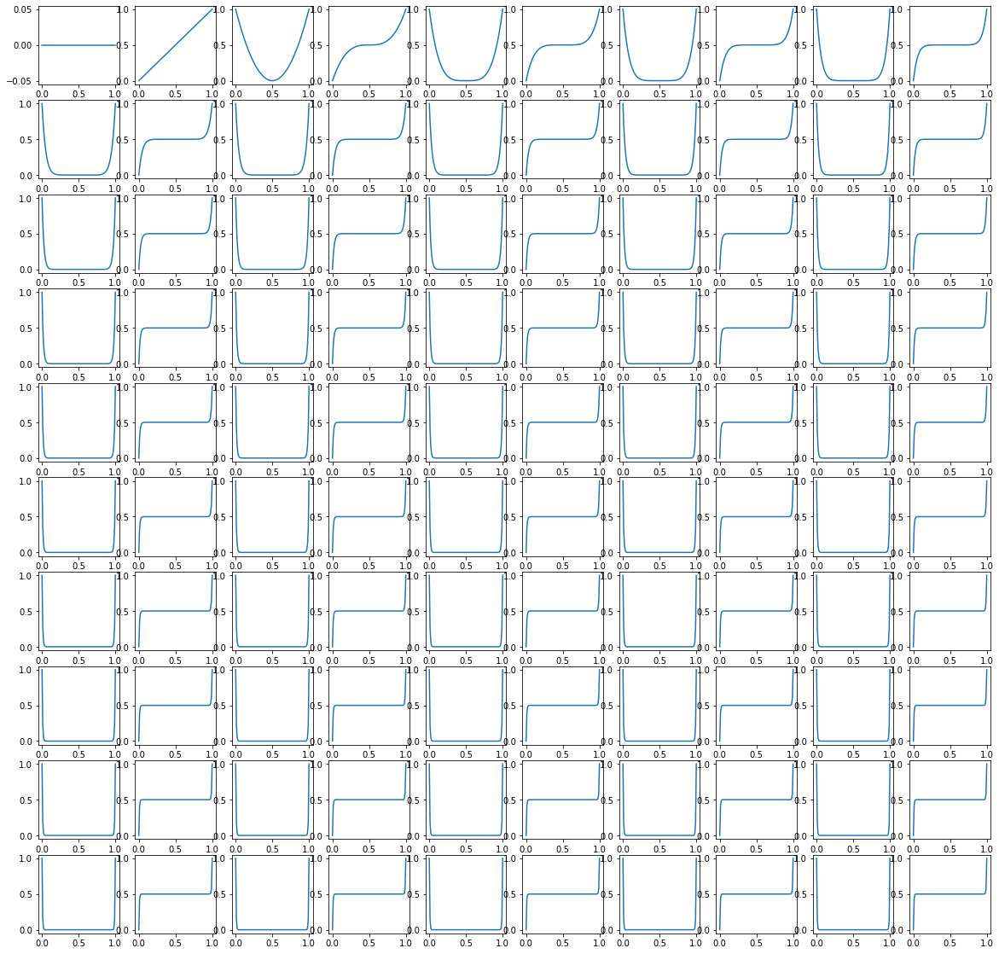

In [26]:
# plot the train polynomials
plt.figure(figsize=(20, 20))
for i, f in enumerate(F[: 100, :, :]):
    plt.subplot(10, 10, i + 1)
    plt.plot(
        f[:, 1],
        f[:, 0]
    )
    # plt.axis('off')
    del i, f
plt.show()

In [27]:
train_idx = np.random.default_rng(
    seed
).choice(
    F.shape[0],
    size=int(0.8 * F.shape[0]),
    replace=False
)
test_idx = list(set(range(F.shape[0])) - set(train_idx))

x_train = F[train_idx].astype('float32')
x_test = F[test_idx].astype('float32')

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_6 (Conv1D)            (None, 49, 32)            224       
_________________________________________________________________
batch_normalization_15 (Batc (None, 49, 32)            128       
_________________________________________________________________
activation_15 (Activation)   (None, 49, 32)            0         
_________________________________________________________________
conv1d_7 (Conv1D)            (None, 24, 64)            6208      
_________________________________________________________________
batch_normalization_16 (Batc (None, 24, 64)            256       
_________________________________________________________________
activation_16 (Activation)   (None, 24, 64)            0         
_________________________________________________________________
flatten_3 (Flatten)          (None, 1536)             

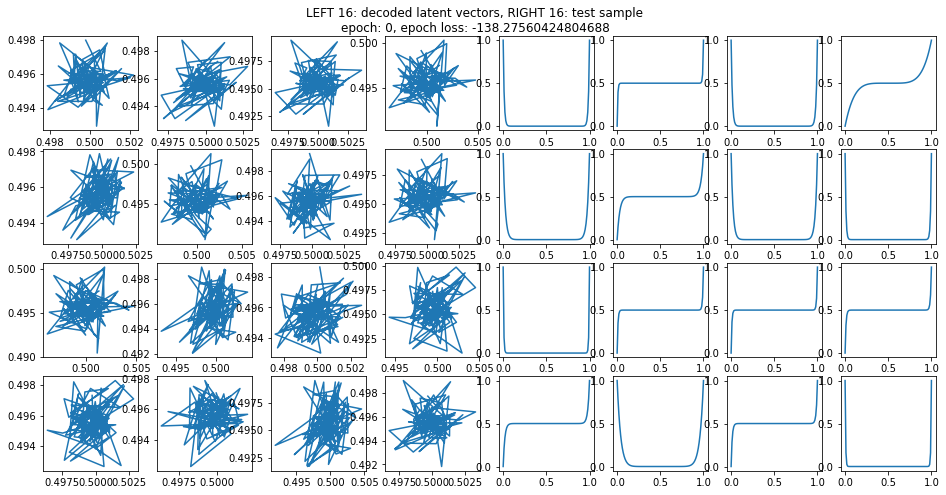

1.841369867324829 -- time elapse for 0 epoch.
Mean loss over test batches: -137.84677124023438, epoch: 1


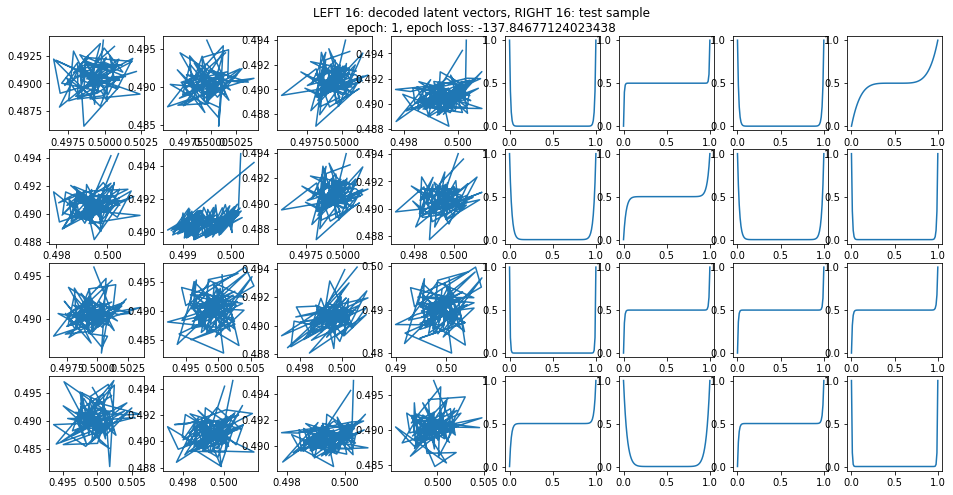

0.015995025634765625 -- time elapse for 1 epoch.
Mean loss over test batches: -137.3461151123047, epoch: 2


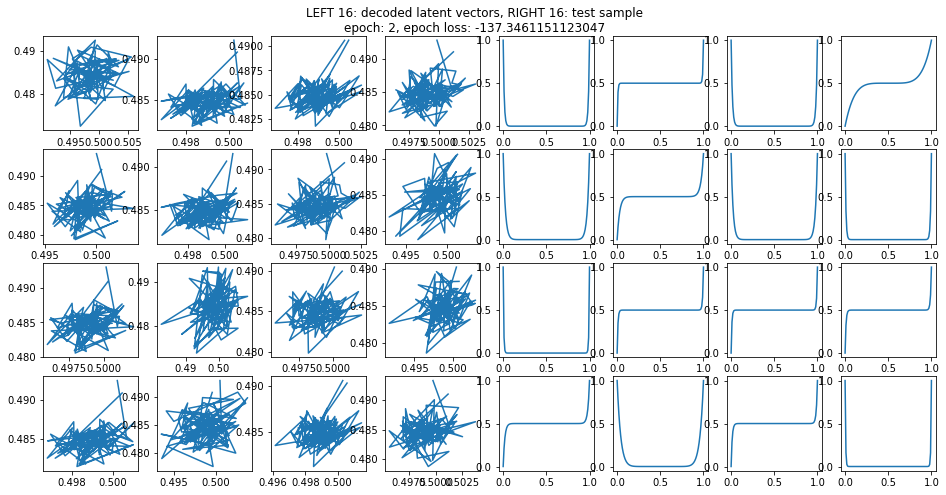

0.014993429183959961 -- time elapse for 2 epoch.
Mean loss over test batches: -136.77963256835938, epoch: 3


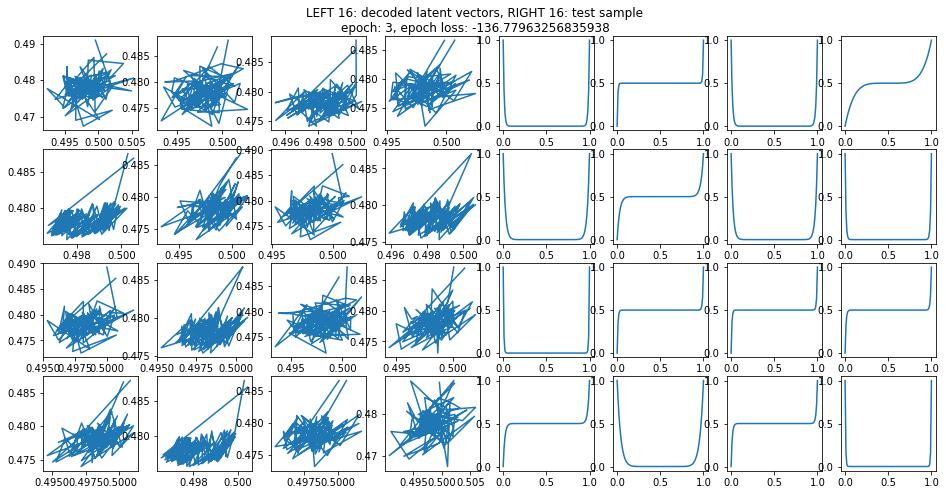

0.014995813369750977 -- time elapse for 3 epoch.
Mean loss over test batches: -136.240966796875, epoch: 4


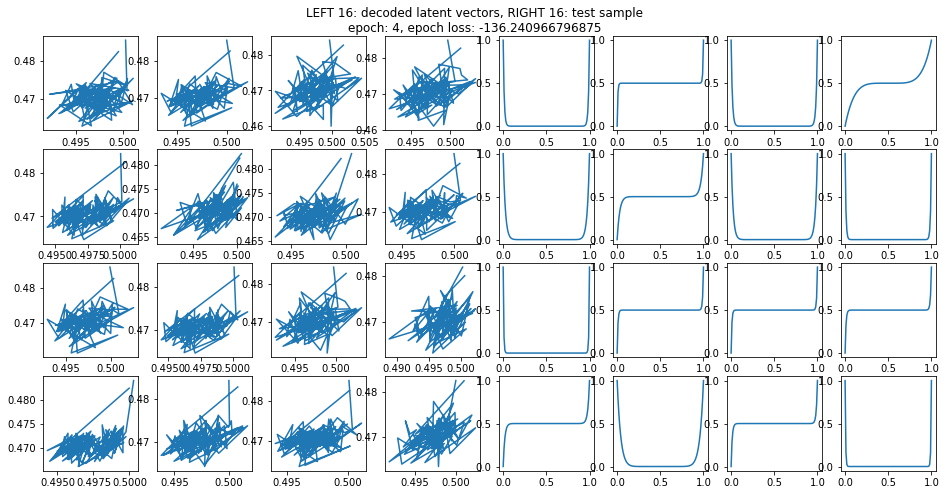

0.015992164611816406 -- time elapse for 4 epoch.
Mean loss over test batches: -135.5797576904297, epoch: 5


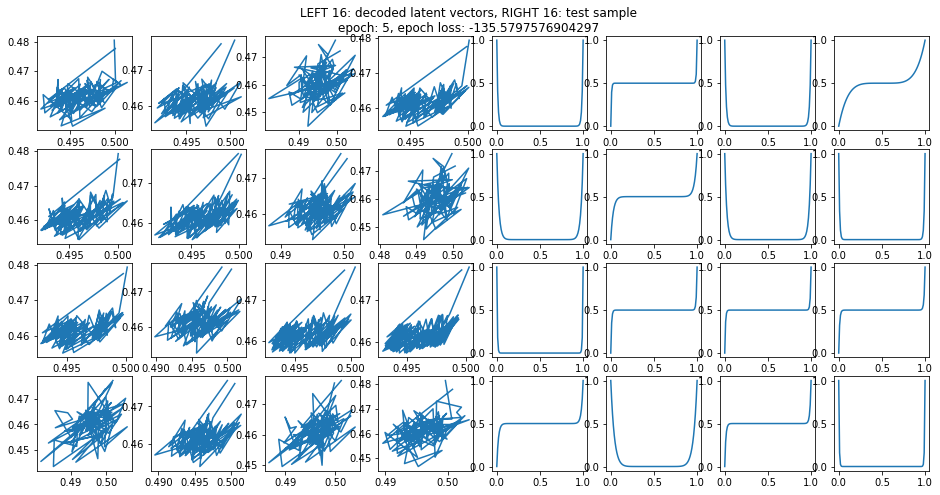

0.013997077941894531 -- time elapse for 5 epoch.
Mean loss over test batches: -134.78890991210938, epoch: 6


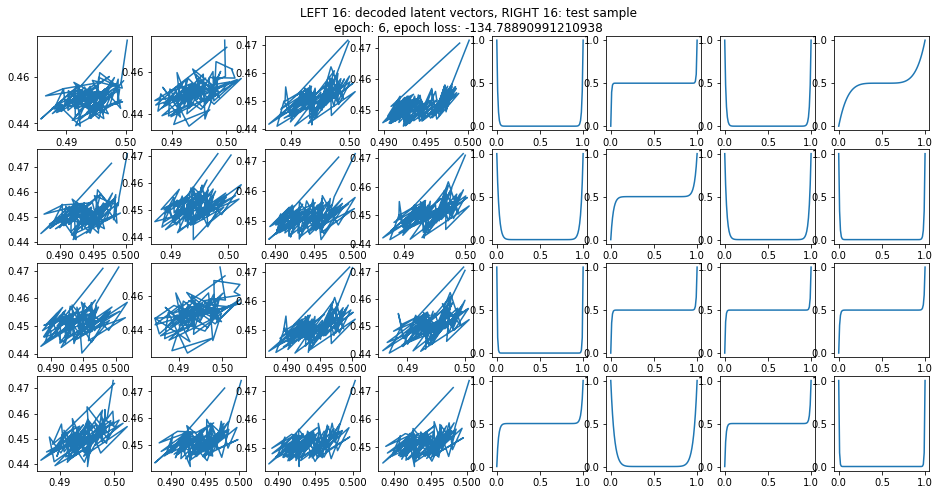

0.027765989303588867 -- time elapse for 6 epoch.
Mean loss over test batches: -133.92755126953125, epoch: 7


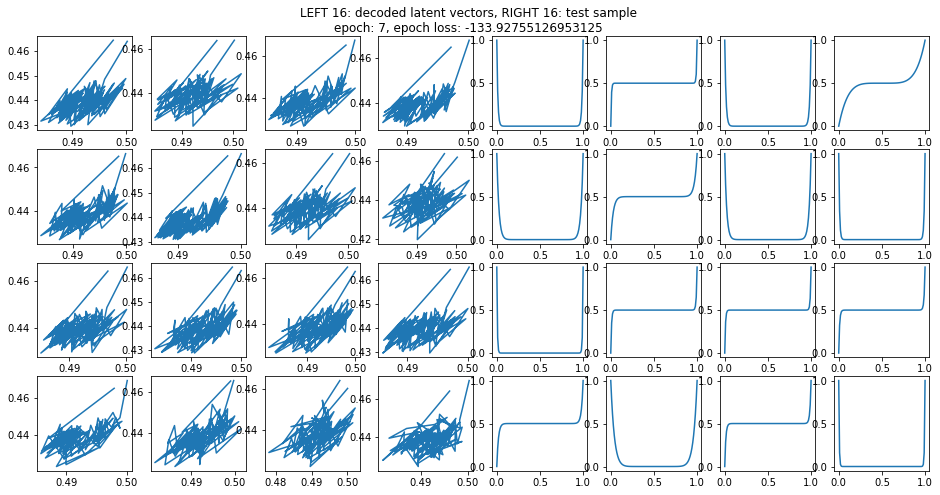

0.01760125160217285 -- time elapse for 7 epoch.
Mean loss over test batches: -132.96694946289062, epoch: 8


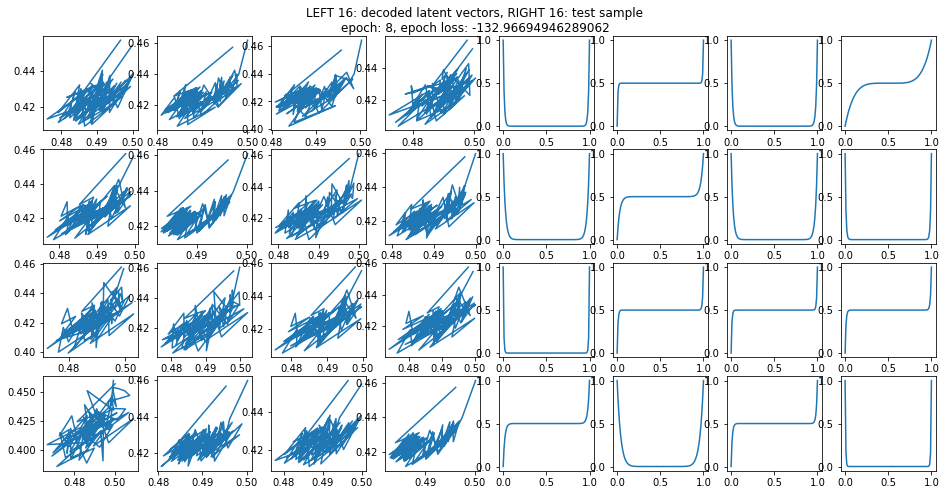

0.02357196807861328 -- time elapse for 8 epoch.
Mean loss over test batches: -132.1319122314453, epoch: 9


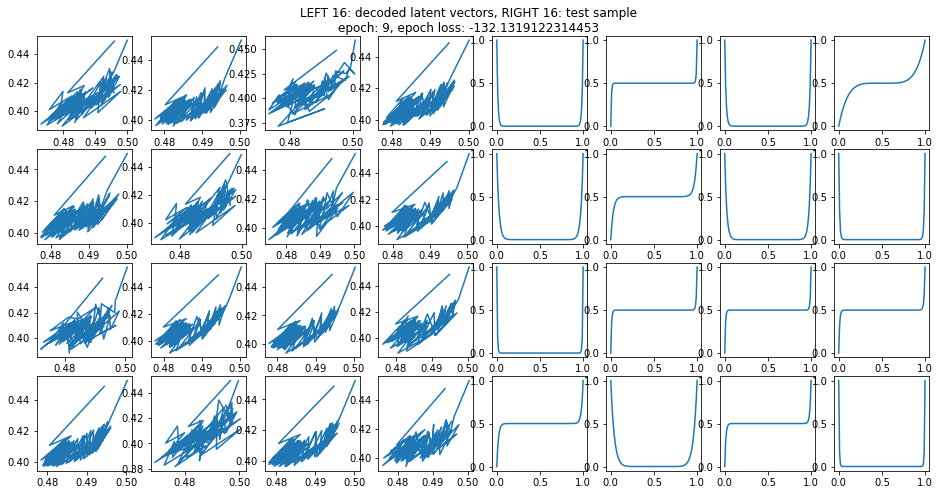

0.02480459213256836 -- time elapse for 9 epoch.
Mean loss over test batches: -131.23902893066406, epoch: 10


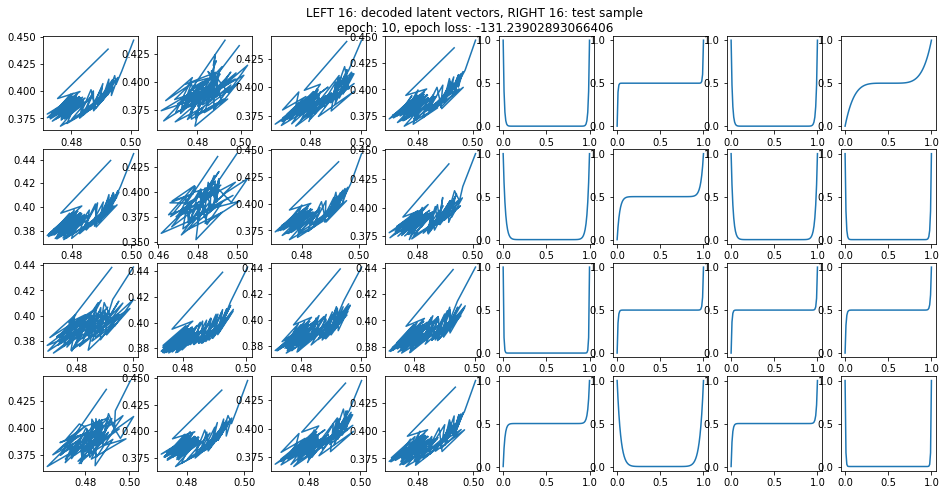

0.017992258071899414 -- time elapse for 10 epoch.
Mean loss over test batches: -130.36619567871094, epoch: 11


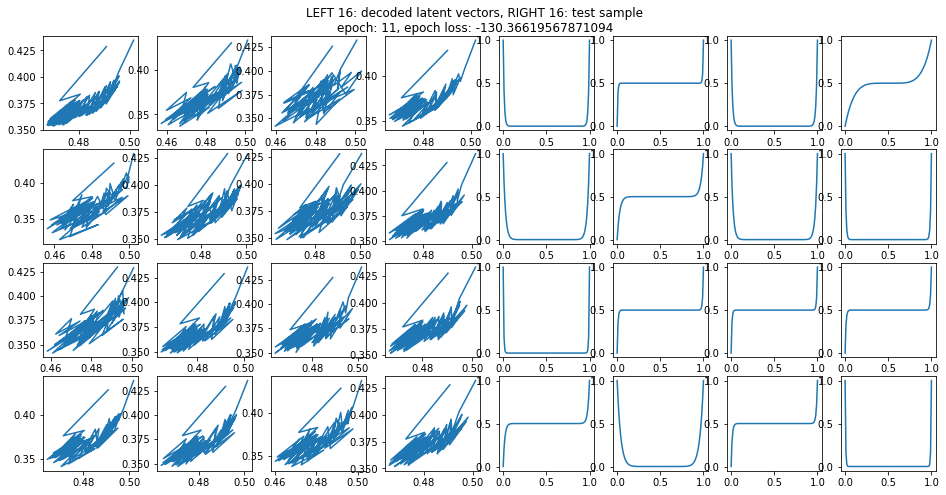

0.01499485969543457 -- time elapse for 11 epoch.
Mean loss over test batches: -129.48928833007812, epoch: 12


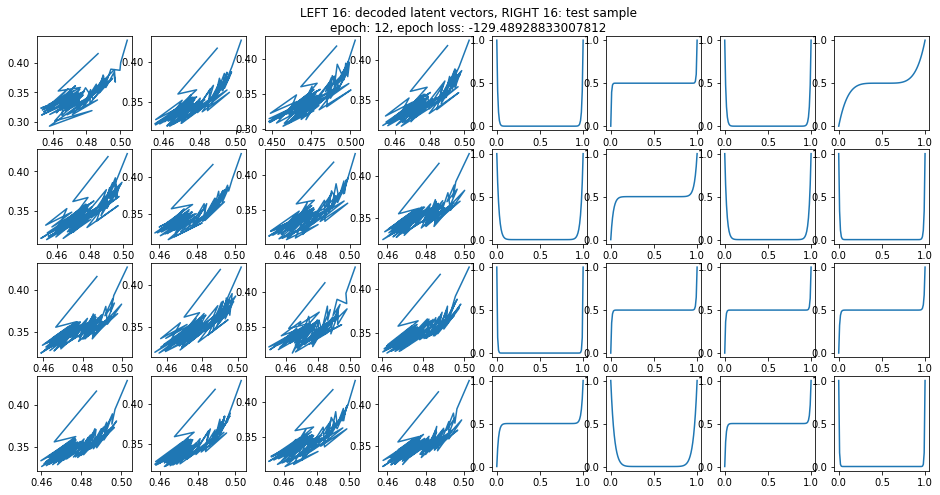

0.015999317169189453 -- time elapse for 12 epoch.
Mean loss over test batches: -128.77249145507812, epoch: 13


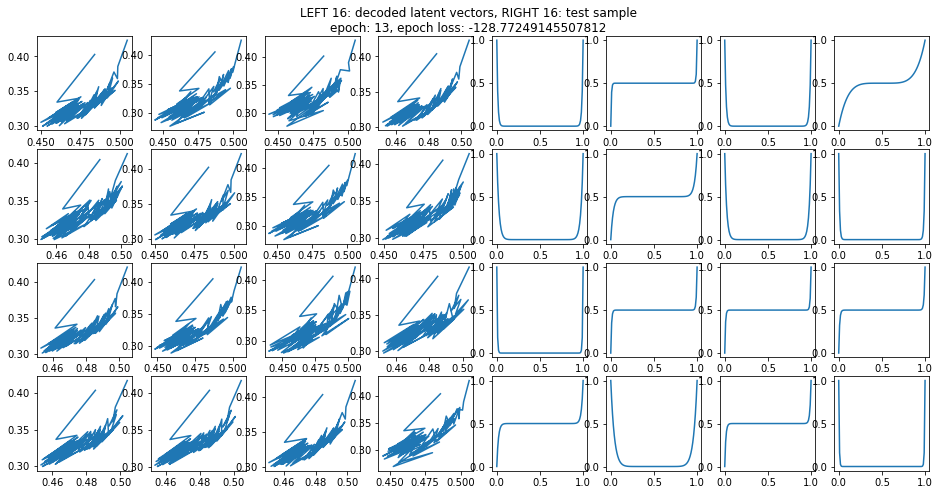

0.02546858787536621 -- time elapse for 13 epoch.
Mean loss over test batches: -128.17486572265625, epoch: 14


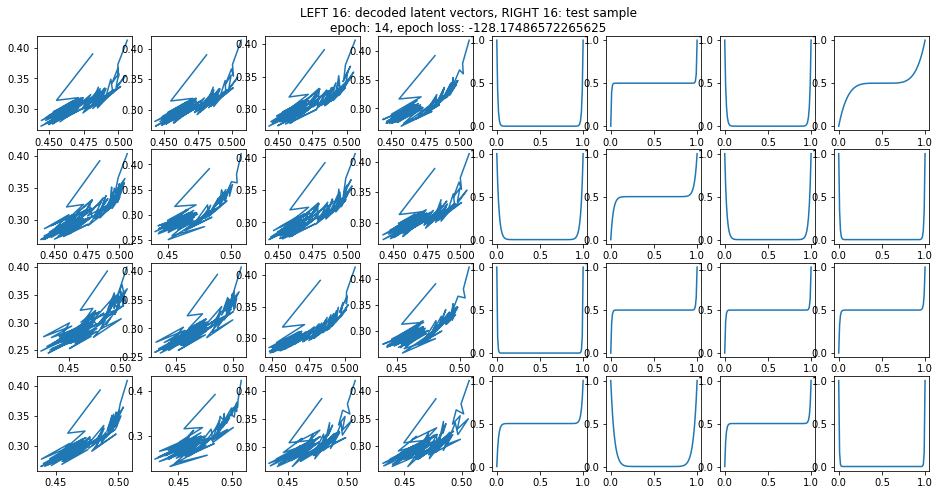

0.01905989646911621 -- time elapse for 14 epoch.
Mean loss over test batches: -127.46122741699219, epoch: 15


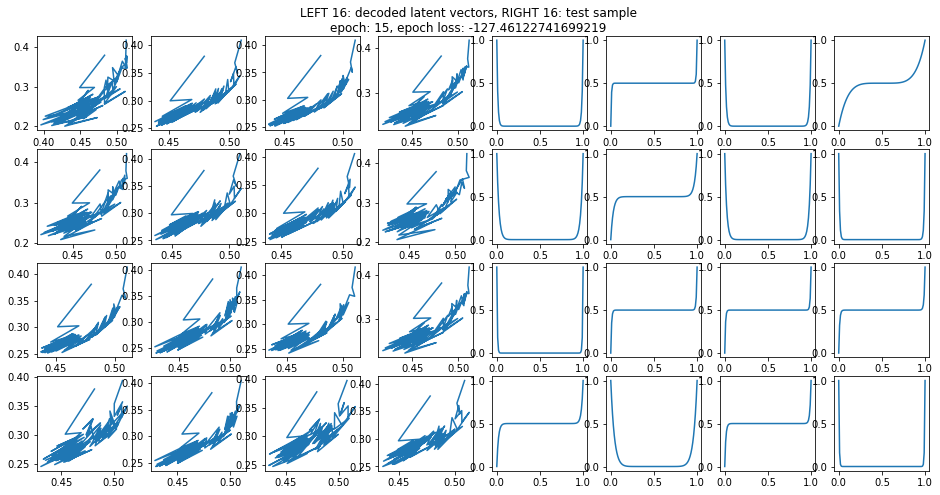

0.019580364227294922 -- time elapse for 15 epoch.
Mean loss over test batches: -126.98594665527344, epoch: 16


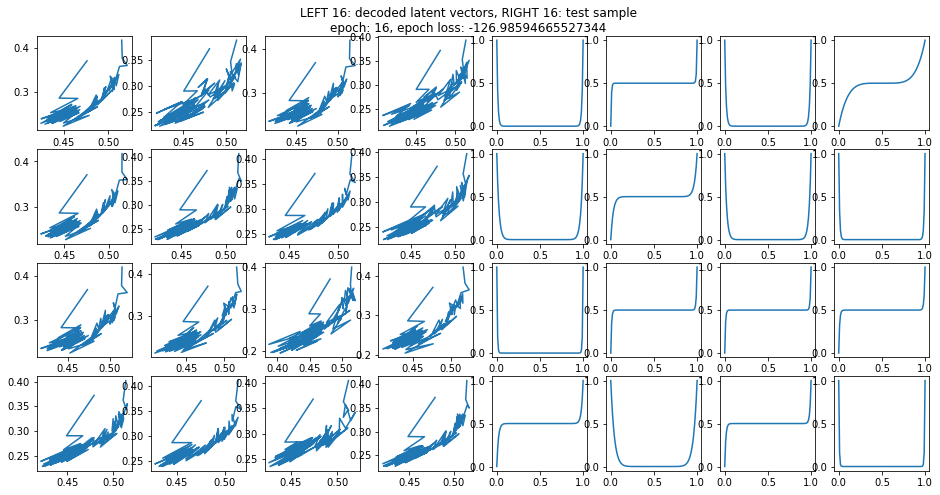

0.017995119094848633 -- time elapse for 16 epoch.
Mean loss over test batches: -126.43643951416016, epoch: 17


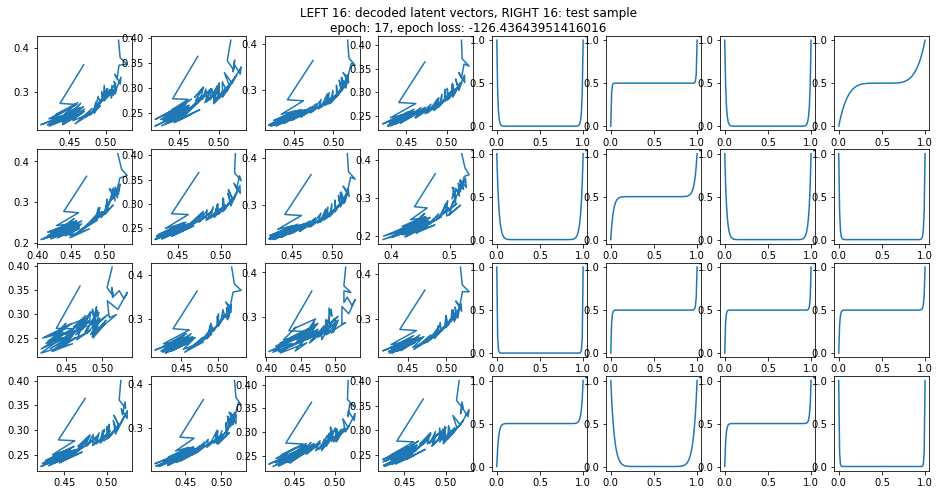

0.0253448486328125 -- time elapse for 17 epoch.
Mean loss over test batches: -125.97467041015625, epoch: 18


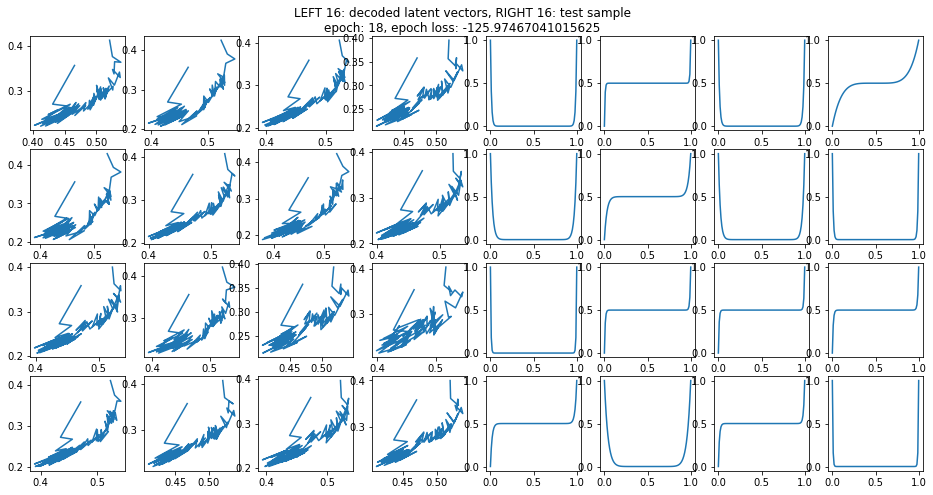

0.031572818756103516 -- time elapse for 18 epoch.
Mean loss over test batches: -124.7743148803711, epoch: 19


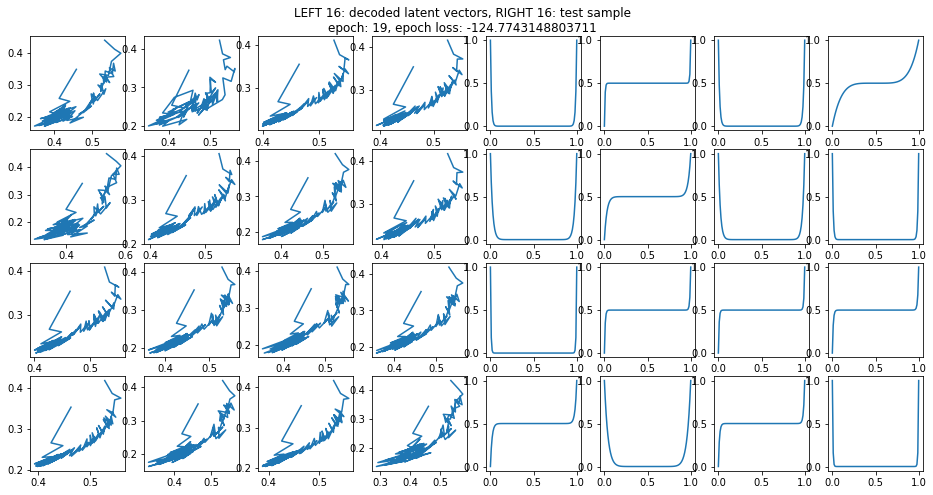

0.019997835159301758 -- time elapse for 19 epoch.


In [28]:
# train VAE
vae_obj = tvae.VAE(x_train[0, :, :].shape, latent_dim=2, save_dir=None)

vae_obj.train(
      x_train,
      x_test=x_test,
      epochs=20
)

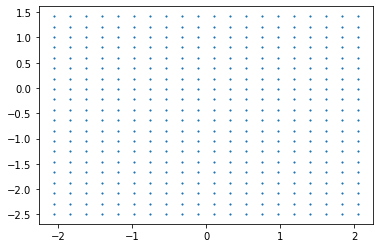

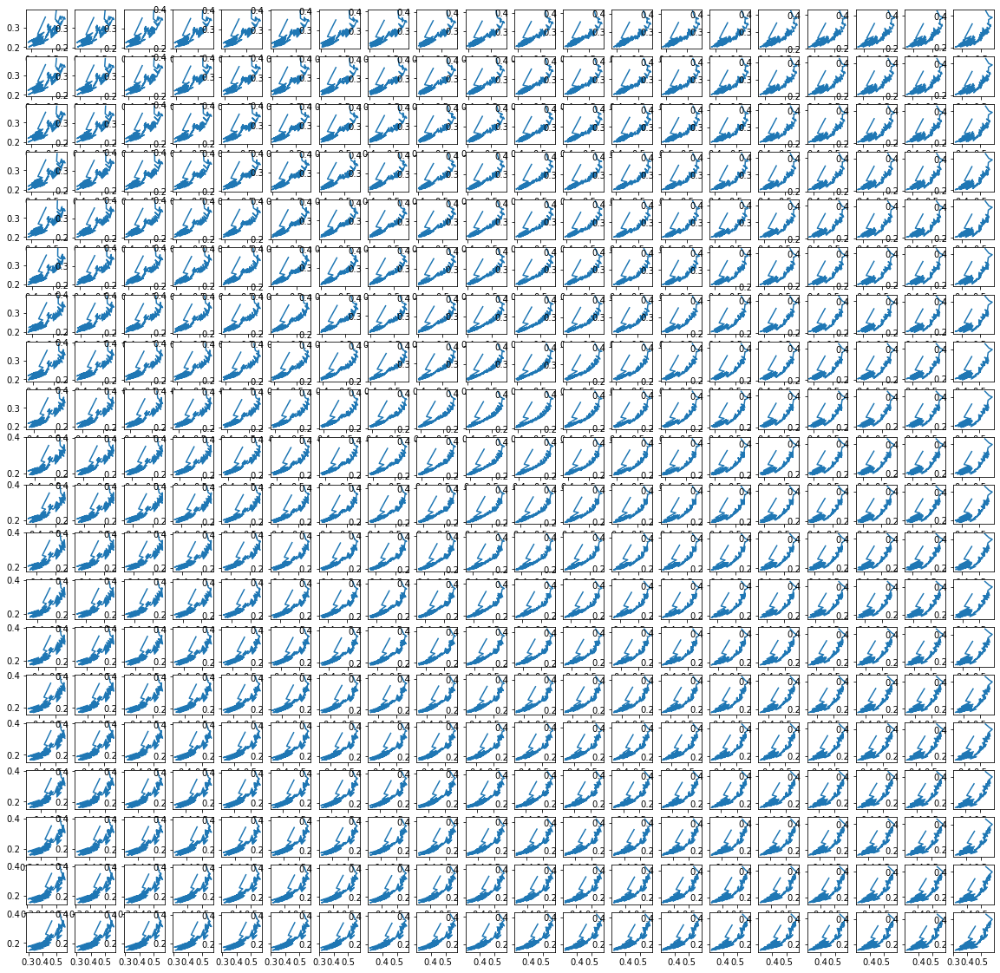

In [29]:
latent_vectors = vae_obj.generate_latent_vectors(x_test)
lattice = vae_obj.gen_lattice_from_latent_space(latent_vectors, 20)
decoded_latice = vae_obj.decode_latent_vectors(lattice)

plt.scatter(
    lattice[:, 0],
    lattice[:, 1],
    marker='X',
    s=1,
)
plt.show()

plt.figure(figsize=(20, 20))
for i in range(lattice.shape[0]):
    plt.subplot(20, 20, i+1)
    plt.plot(
        decoded_latice[i, :, 1],
        decoded_latice[i, :, 0]
    )
    # plt.axis('off')
del i
plt.show()

In [30]:
# Legendre polynomials
coeffs_matrix = tvae.gen_legendre_coeffs_matrix(highest_degree=100)

bounding_region, F = tvae.make_poly_curves_from_coefficients(
    coeffs_matrix, 
    num_points=1000
)

C:\Users\the_s\Documents\python_projects\github\taylor_vae\vae\taylor_vae.py:451: RuntimeWarning: invalid value encountered in true_divide
  (F[:, :, i] - a) / (b - a)


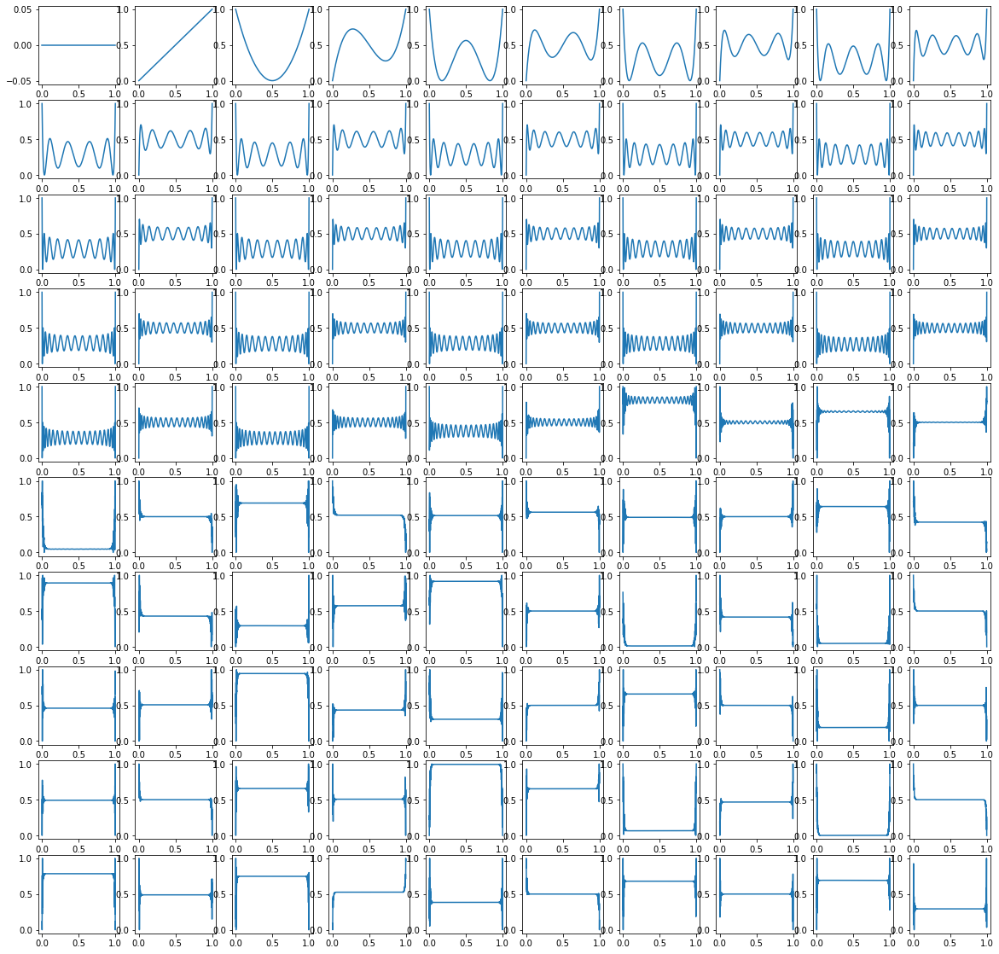

In [31]:
# plot the train polynomials
plt.figure(figsize=(20, 20))
for i, f in enumerate(F[: 100, :, :]):
    plt.subplot(10, 10, i + 1)
    plt.plot(
        f[:, 1],
        f[:, 0]
    )
    # plt.axis('off')
    del i, f
plt.show()

In [32]:
train_idx = np.random.default_rng(
    seed
).choice(
    F.shape[0],
    size=int(0.8 * F.shape[0]),
    replace=False
)
test_idx = list(set(range(F.shape[0])) - set(train_idx))

x_train = F[train_idx].astype('float32')
x_test = F[test_idx].astype('float32')

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_8 (Conv1D)            (None, 499, 32)           224       
_________________________________________________________________
batch_normalization_20 (Batc (None, 499, 32)           128       
_________________________________________________________________
activation_20 (Activation)   (None, 499, 32)           0         
_________________________________________________________________
conv1d_9 (Conv1D)            (None, 249, 64)           6208      
_________________________________________________________________
batch_normalization_21 (Batc (None, 249, 64)           256       
_________________________________________________________________
activation_21 (Activation)   (None, 249, 64)           0         
_________________________________________________________________
flatten_4 (Flatten)          (None, 15936)            

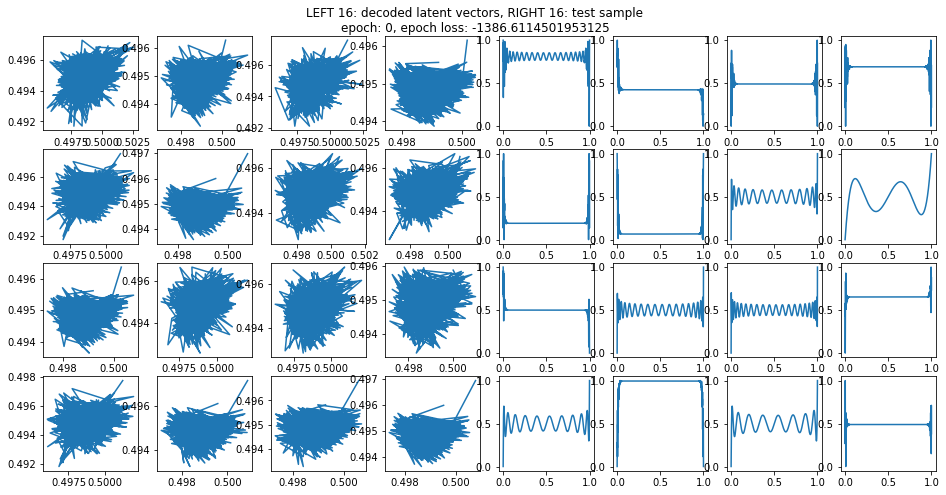

1.578047752380371 -- time elapse for 0 epoch.
Mean loss over test batches: -1386.9642333984375, epoch: 1


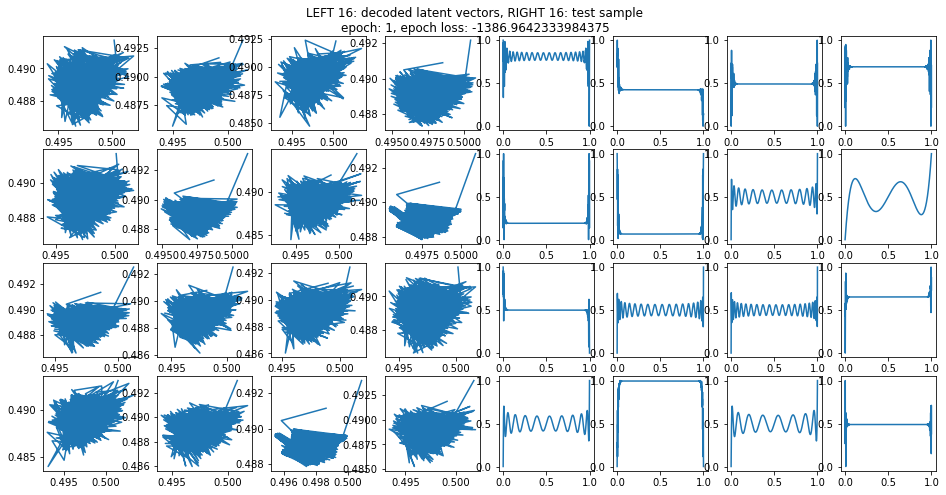

0.12383031845092773 -- time elapse for 1 epoch.
Mean loss over test batches: -1387.572021484375, epoch: 2


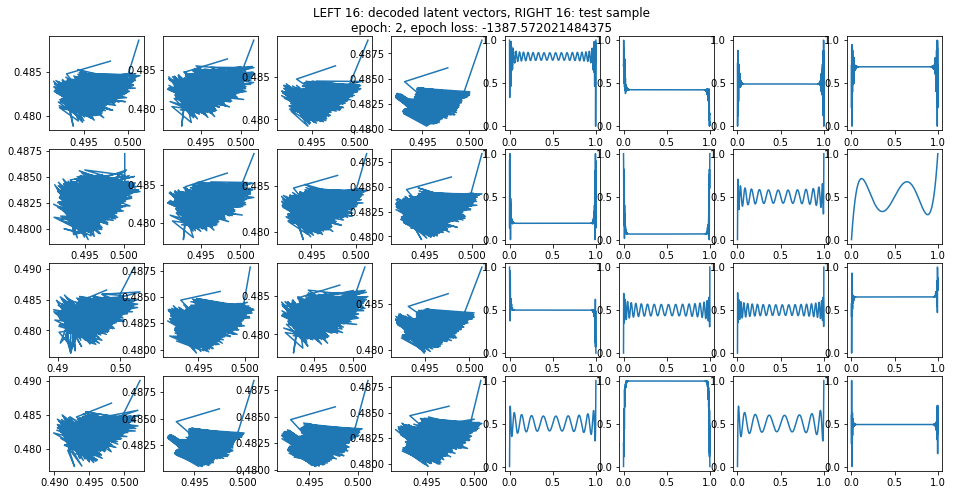

0.12627387046813965 -- time elapse for 2 epoch.
Mean loss over test batches: -1387.97802734375, epoch: 3


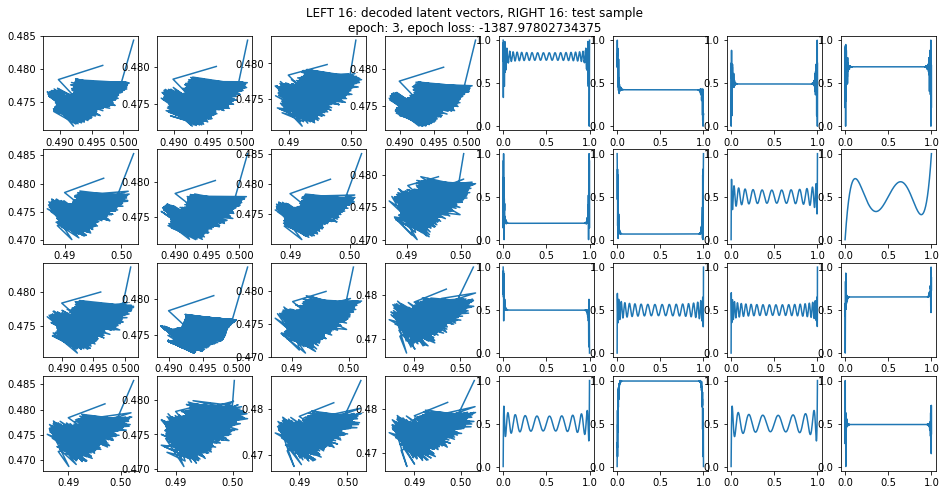

0.140855073928833 -- time elapse for 3 epoch.
Mean loss over test batches: -1388.3143310546875, epoch: 4


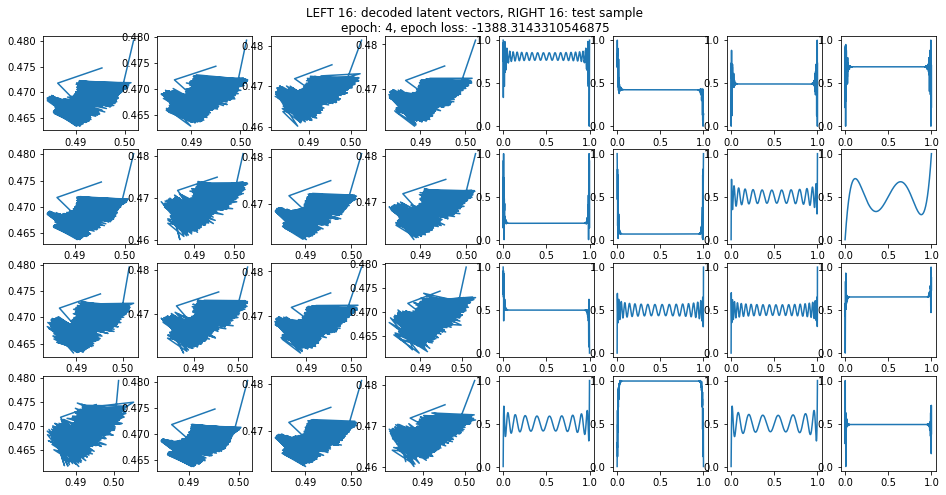

0.11678791046142578 -- time elapse for 4 epoch.
Mean loss over test batches: -1388.7637939453125, epoch: 5


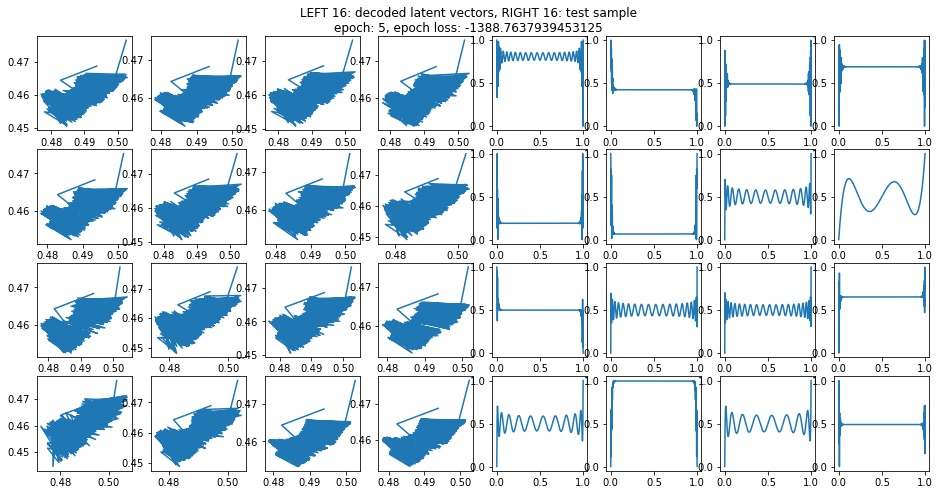

0.12342667579650879 -- time elapse for 5 epoch.
Mean loss over test batches: -1387.9716796875, epoch: 6


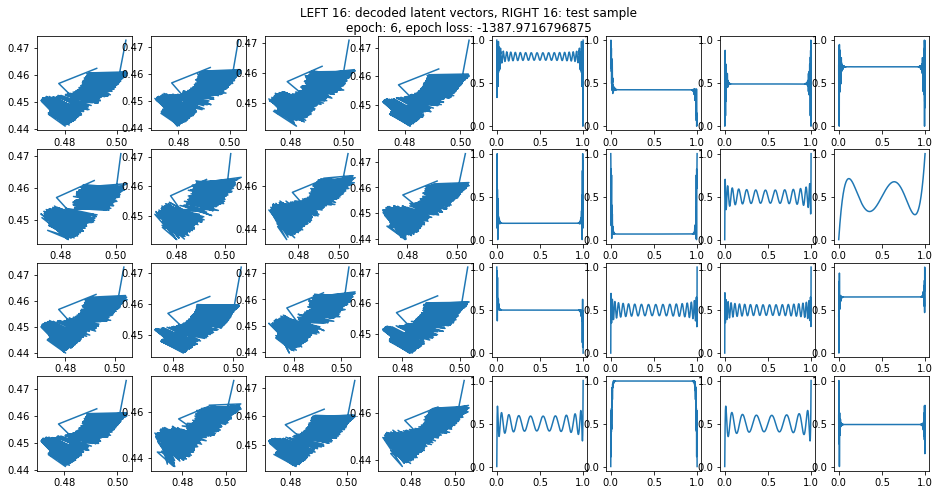

0.12050437927246094 -- time elapse for 6 epoch.
Mean loss over test batches: -1385.956298828125, epoch: 7


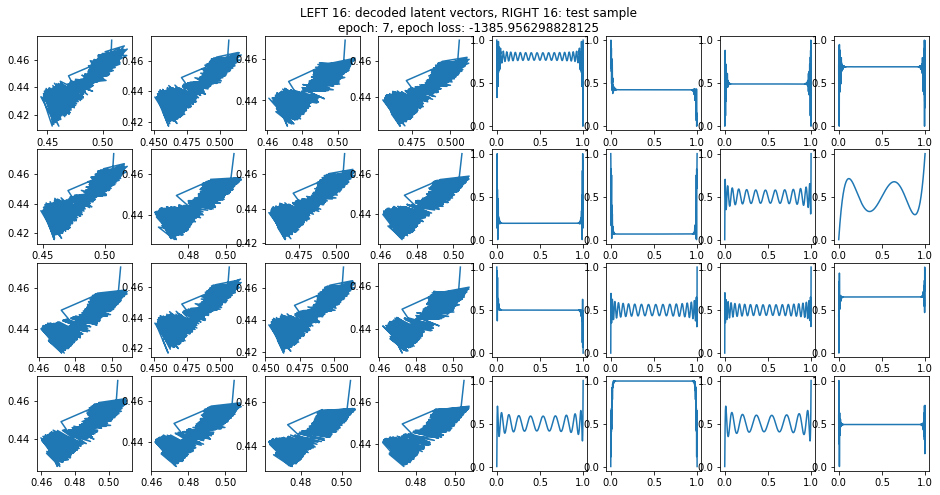

0.1410207748413086 -- time elapse for 7 epoch.
Mean loss over test batches: -1381.3404541015625, epoch: 8


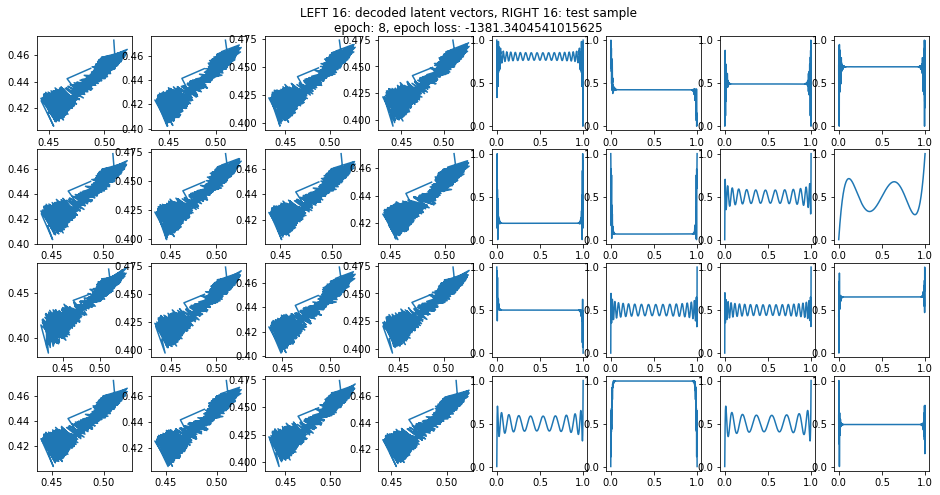

0.12091374397277832 -- time elapse for 8 epoch.
Mean loss over test batches: -1374.03271484375, epoch: 9


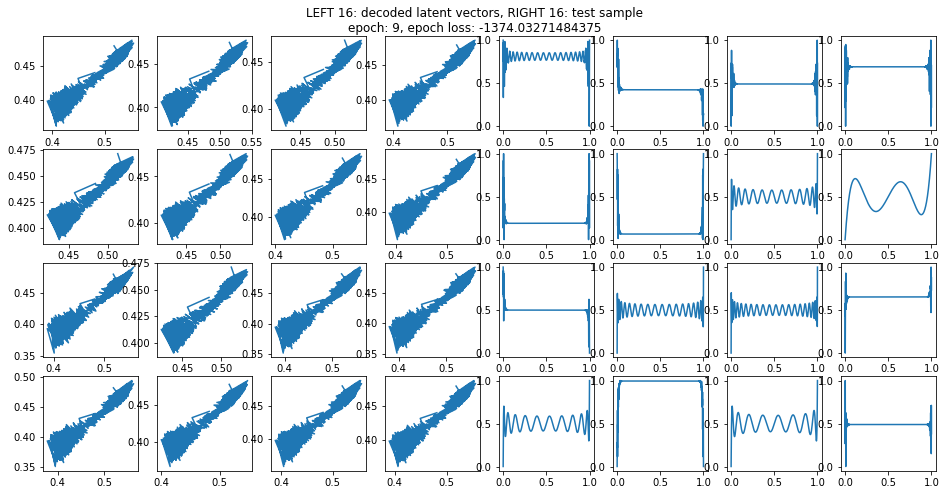

0.11292362213134766 -- time elapse for 9 epoch.
Mean loss over test batches: -1359.4681396484375, epoch: 10


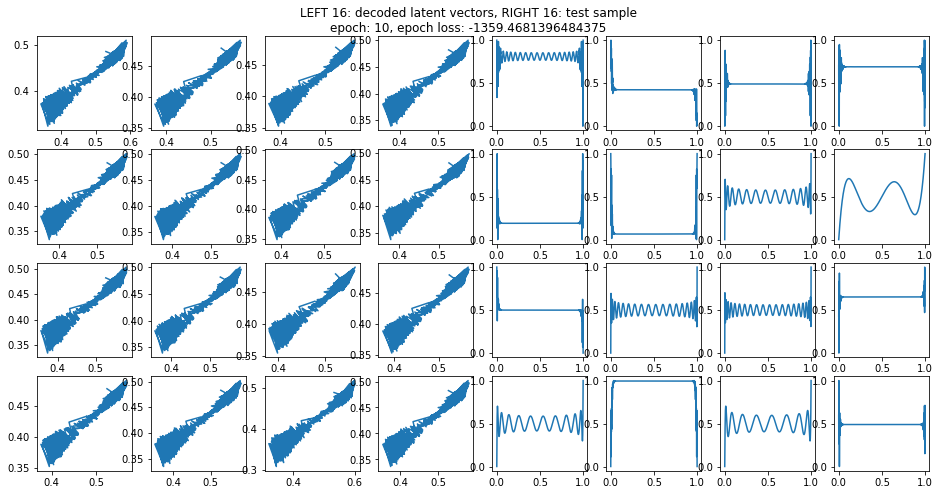

0.13567900657653809 -- time elapse for 10 epoch.
Mean loss over test batches: -1341.91845703125, epoch: 11


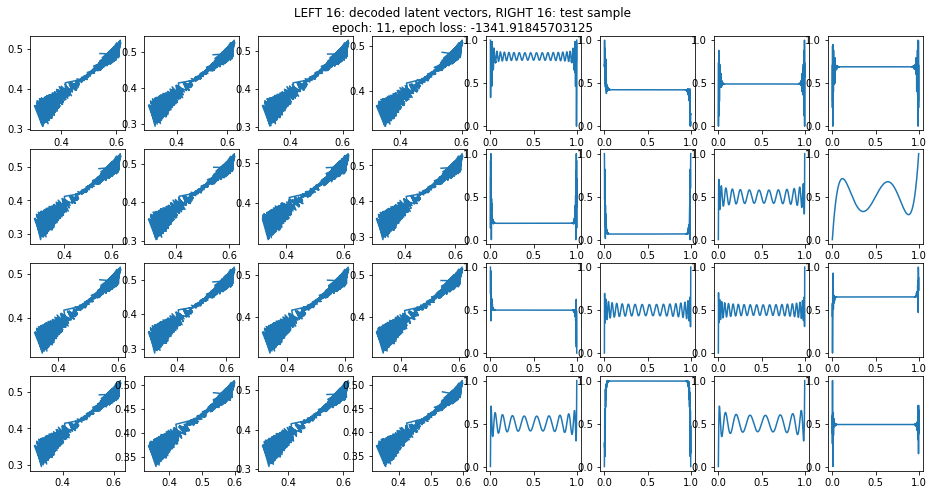

0.12250494956970215 -- time elapse for 11 epoch.
Mean loss over test batches: -1321.447998046875, epoch: 12


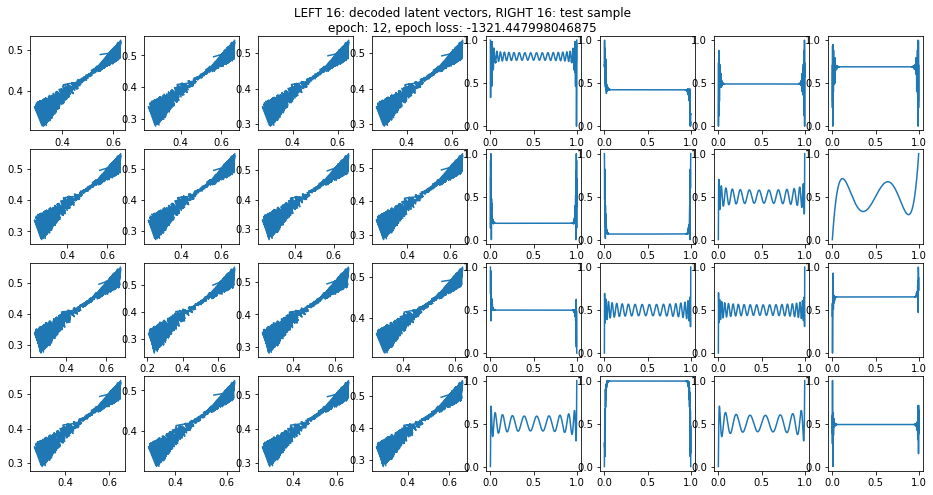

0.13822031021118164 -- time elapse for 12 epoch.
Mean loss over test batches: -1301.224365234375, epoch: 13


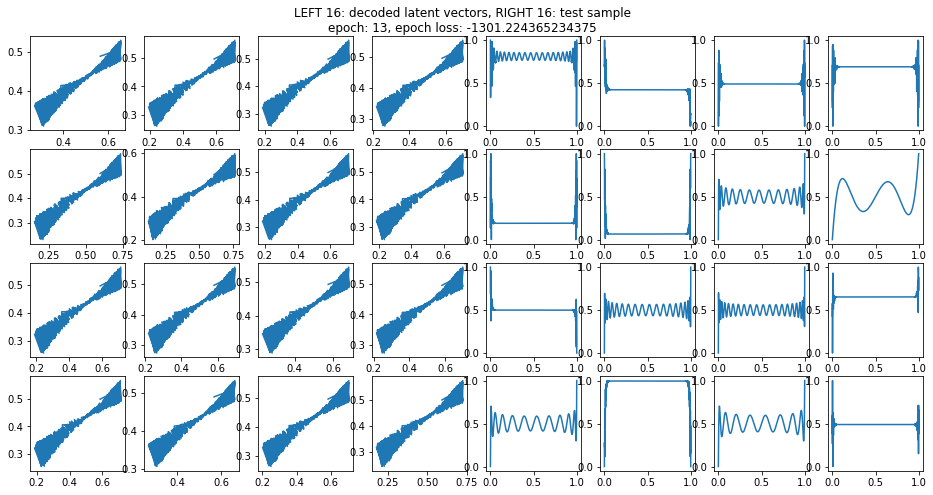

0.11910390853881836 -- time elapse for 13 epoch.
Mean loss over test batches: -1282.0599365234375, epoch: 14


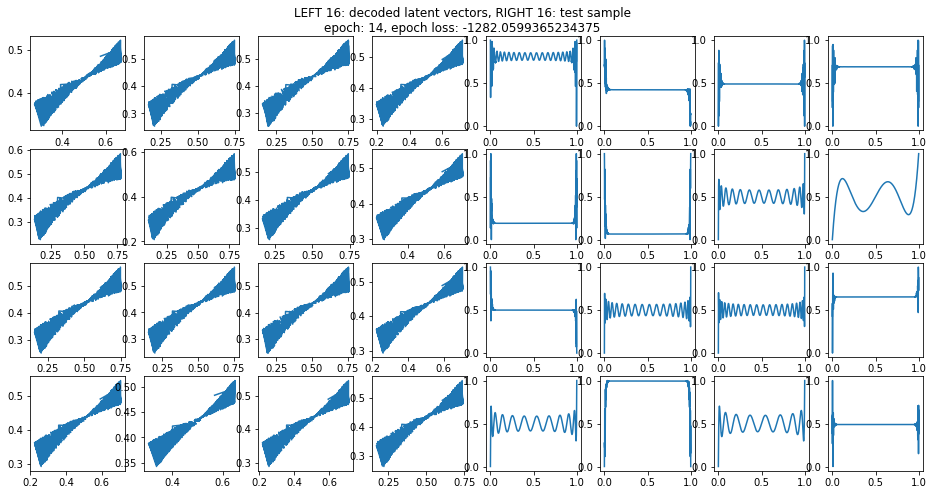

0.12768292427062988 -- time elapse for 14 epoch.
Mean loss over test batches: -1266.131591796875, epoch: 15


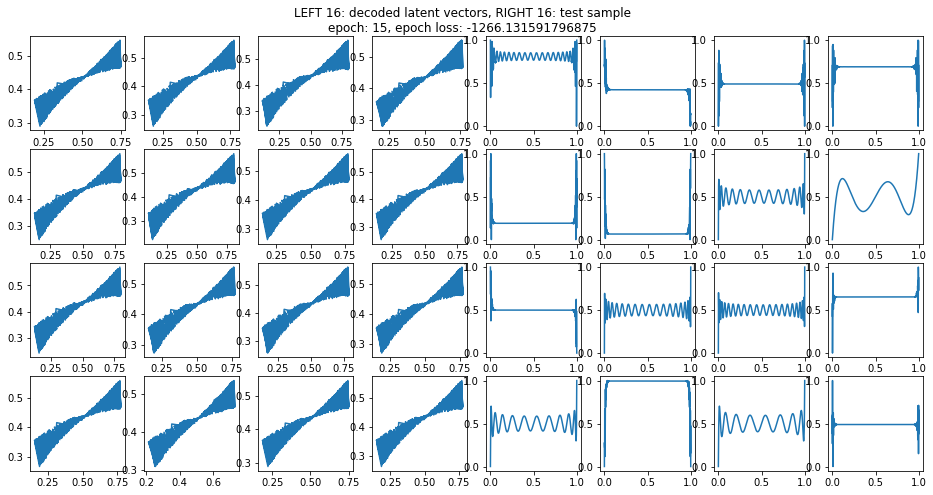

0.11884474754333496 -- time elapse for 15 epoch.
Mean loss over test batches: -1252.3238525390625, epoch: 16


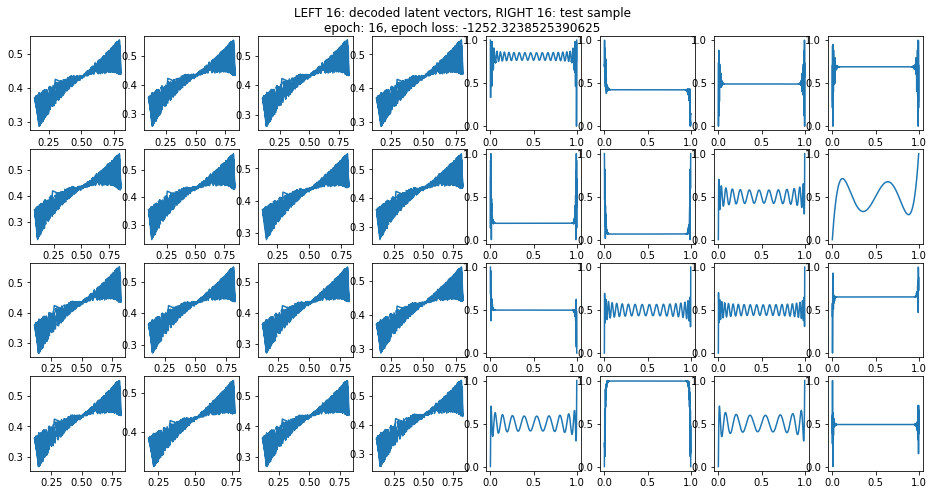

0.13234472274780273 -- time elapse for 16 epoch.
Mean loss over test batches: -1241.5467529296875, epoch: 17


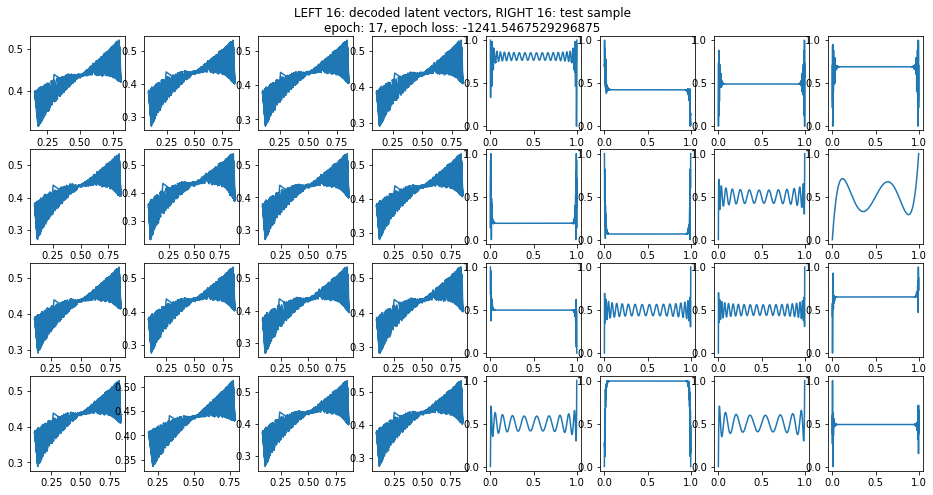

0.14208149909973145 -- time elapse for 17 epoch.
Mean loss over test batches: -1234.177978515625, epoch: 18


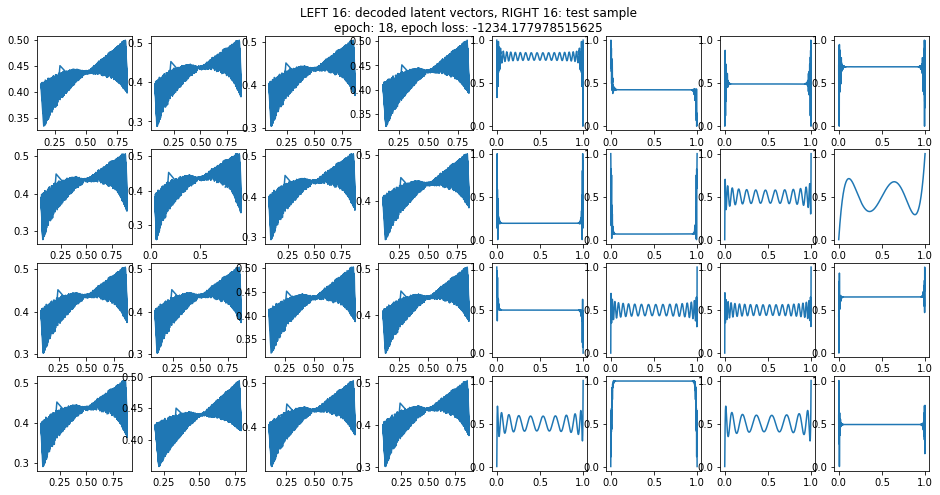

0.11415600776672363 -- time elapse for 18 epoch.
Mean loss over test batches: -1230.4013671875, epoch: 19


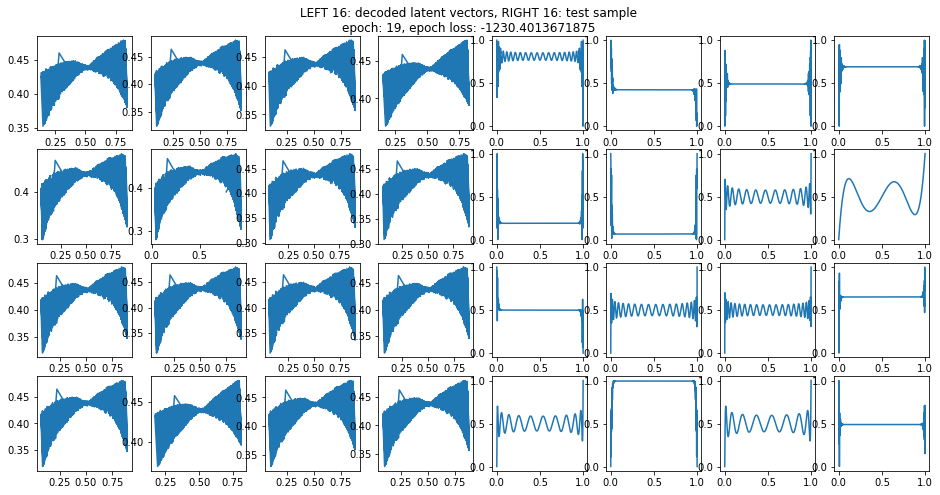

0.1474778652191162 -- time elapse for 19 epoch.


In [33]:
# train VAE
vae_obj = tvae.VAE(x_train[0, :, :].shape, latent_dim=2, save_dir=None)

vae_obj.train(
      x_train,
      x_test=x_test,
      epochs=20
)

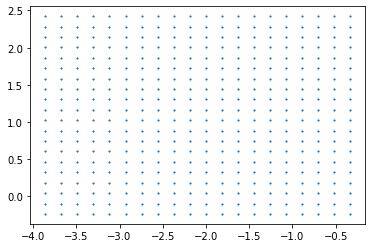

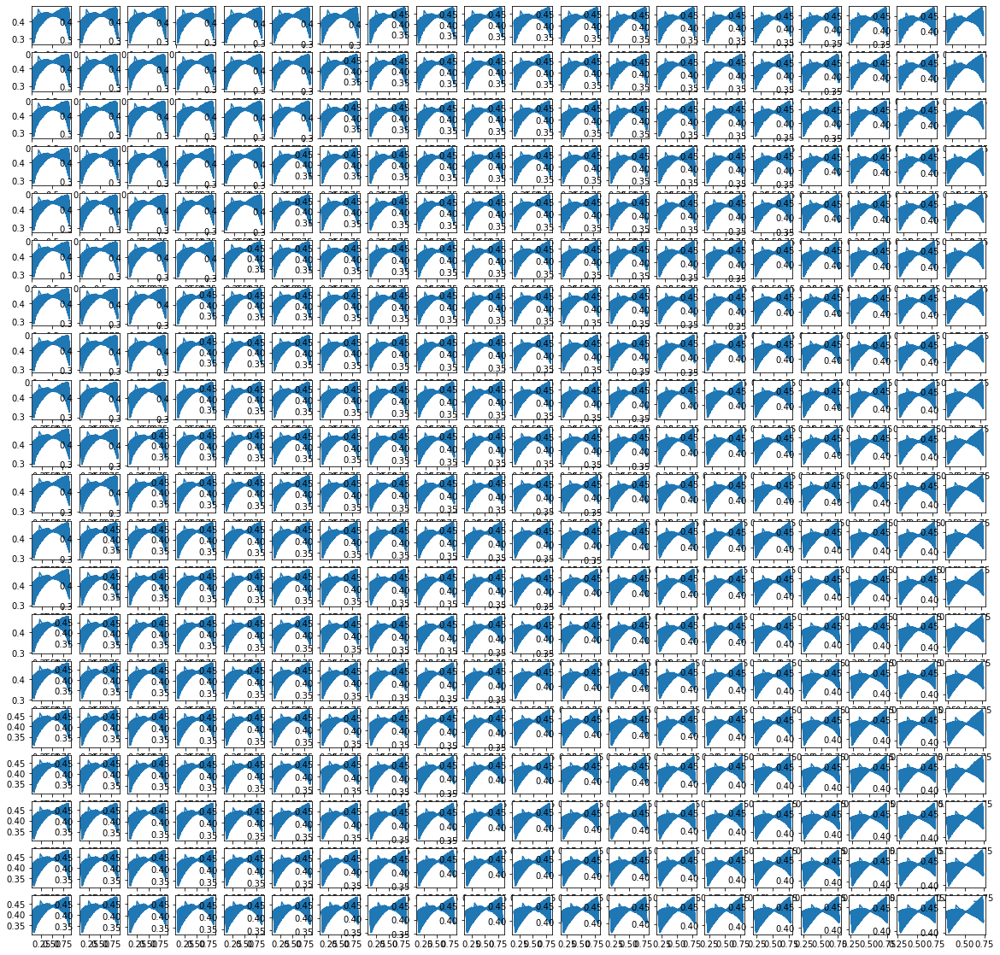

In [34]:
latent_vectors = vae_obj.generate_latent_vectors(x_test)
lattice = vae_obj.gen_lattice_from_latent_space(latent_vectors, 20)
decoded_latice = vae_obj.decode_latent_vectors(lattice)

plt.scatter(
    lattice[:, 0],
    lattice[:, 1],
    marker='X',
    s=1,
)
plt.show()

plt.figure(figsize=(20, 20))
for i in range(lattice.shape[0]):
    plt.subplot(20, 20, i+1)
    plt.plot(
        decoded_latice[i, :, 1],
        decoded_latice[i, :, 0]
    )
    # plt.axis('off')
del i
plt.show()